<a href="https://colab.research.google.com/github/shahdelmasry12/AI-and-ML-Level2-ITI/blob/main/Computer_Vision_part_1_ITI_Level2_Shahd_Moatasem.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Computer Vision — Practical Notebook

**Companion lab for: Computer Vision Foundations → Neural Network Fundamentals → Image & Data Preparation → Convolutional Neural Networks → CNN Architecture → Data Augmentation → Transfer Learning**

---

This notebook is the complete hands-on companion to the lecture deck. It has two halves:

- **Part A — Classical Computer Vision** (`cv2` + NumPy): images as numbers, color
  spaces, thresholding, morphology, filters/convolution, Sobel, Canny, geometric
  transforms, histogram equalization. Nothing is "trained" here — this is the
  toolkit used in industry every day *before* any neural network gets involved.
- **Part B — Neural Networks & CNNs from scratch** (mostly plain NumPy, a little
  PyTorch at the end): a single neuron and MLP forward pass, activation
  functions, weight initialization and why it matters, batch normalization,
  residual connections, overfitting/underfitting and regularization, then the
  mechanics of **convolution, padding, stride, and pooling** built by hand
  before you ever call `nn.Conv2d`, finishing with **data augmentation** and a
  short note on **transfer learning**.

To make the *why* stick, key operations are implemented **twice**: once by hand
with NumPy so you see the mechanics, then with the one-line library call
(`cv2....` or `torch.nn....`) you would actually use in production.

> **How to run this:** Google Colab has everything pre-installed. Locally you
> need `opencv-python`, `numpy`, `matplotlib`, `scikit-image`, and `torch` (only
> for the very last section). No GPU required — everything here runs fine on CPU.

> **Legend:** `???` marks something for you to fill in (STUDENT version only).
> Blocks starting with `> *Lecture recap:*` summarize the relevant slide before
> the code makes it concrete.


## 0 · Setup

Import everything we'll need for both parts of the notebook. We keep this
**fully offline and reproducible** — Part A uses a sample image that ships with
`scikit-image` (no downloads needed); Part B builds tiny synthetic datasets
in NumPy so nothing depends on an external download either.


image shape : (512, 512, 3)   (height, width, channels)
dtype       : uint8  -- 8-bit, so pixel values are 0..255
value range : 0 to 255


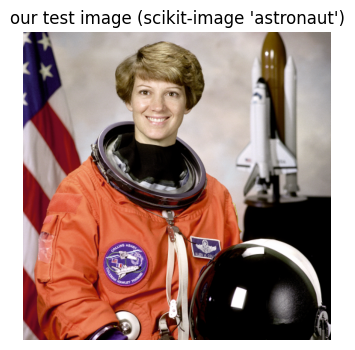

In [1]:
# On a fresh environment you may need:
!pip install opencv-python scikit-image matplotlib numpy torch

import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage import data   # ships with sample images -- keeps us 100% offline

np.random.seed(0)

img_rgb = data.astronaut()          # shape (512, 512, 3), RGB, uint8
print("image shape :", img_rgb.shape, "  (height, width, channels)")
print("dtype       :", img_rgb.dtype, " -- 8-bit, so pixel values are 0..255")
print("value range :", img_rgb.min(), "to", img_rgb.max())

plt.figure(figsize=(4, 4))
plt.imshow(img_rgb)
plt.title("our test image (scikit-image 'astronaut')")
plt.axis("off")
plt.show()


---
# Part A · Classical Computer Vision

Everything in this part happens *before* deep learning: pixels, color spaces,
thresholding, morphology, convolution-based filters, edges, geometric
transforms, and histogram equalization.


## A1 · Images as grids of numbers

> *Lecture recap:* every pixel in an image is a **numerical value** with a
> location `(x, y)`. Treating an image as a grid of numbers is the basis of
> almost every classical technique: you can brighten an image by multiplying
> every pixel, shift it by adding, invert it by subtracting from the max value,
> and so on. Most color and shape transformations are just pixel-by-pixel math.

**The indexing trap:** the lecture talks about pixels at `(x, y)`, but NumPy
arrays are indexed `[row, column]`, i.e. `[y, x]`. Mixing these up is one of
the most common beginner bugs — we'll be careful and always note it.


grayscale shape: (512, 512)  -- just (height, width), no channel axis

a 6x6 patch of raw intensity values:
 [[178 179 181 180 181 180]
 [183 180 179 178 180 180]
 [181 182 179 181 180 183]
 [179 179 178 180 181 180]
 [179 179 178 179 180 181]
 [178 178 180 180 182 182]]

intensity at (x=190, y=375): 121


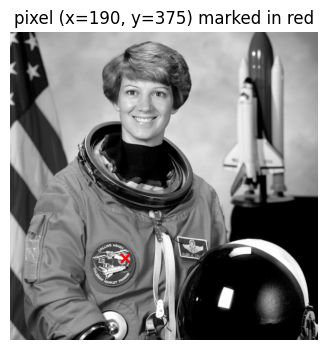

In [2]:
# TODO -- convert img_rgb to grayscale, then inspect a small pixel patch
# and one specific pixel to make "an image is just numbers" concrete.
#
#  1) Convert img_rgb to grayscale with cv2.cvtColor and the right flag.
#  2) Extract a 6x6 patch with slicing, e.g. gray[100:106, 100:106].
#  3) Look up ONE pixel's intensity. REMEMBER: gray[y, x], NOT gray[x, y].

gray =cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)
print("grayscale shape:", gray.shape, " -- just (height, width), no channel axis")

patch =gray[100:106, 100:106]
print("\na 6x6 patch of raw intensity values:\n", patch)

y, x = 375, 190
pixel_value =gray[y, x]  #-- NOT gray[x, y]!
print(f"\nintensity at (x={x}, y={y}):", pixel_value)

plt.figure(figsize=(4, 4))
plt.imshow(gray, cmap="gray", vmin=0, vmax=255)
plt.scatter([x], [y], c="red", s=40, marker="x")
plt.title(f"pixel (x={x}, y={y}) marked in red")
plt.axis("off")
plt.show()


Now the lecture's claim — *"images are numbers, so we can do math on
them"* — demonstrated. **Overflow warning:** `uint8` wraps around at 255, so
brightening must be done in a wider type before clipping back.


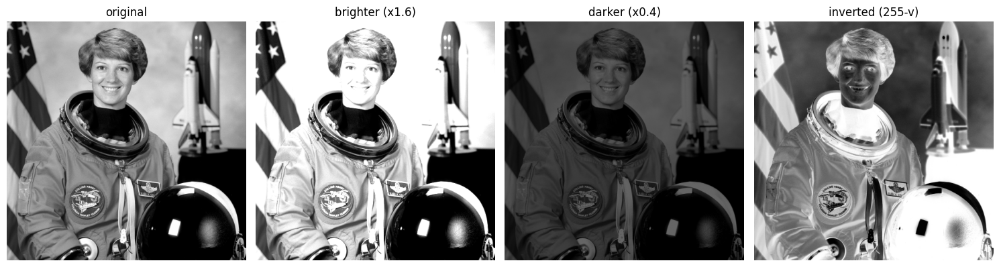

In [3]:
# TODO -- build three transformations of `gray`:
#  - BRIGHTER: multiply every pixel by 1.6, clip to 0..255 (overflow-safe:
#              cast to float, multiply, np.clip, cast back to uint8).
#  - DARKER:   multiply every pixel by 0.4 (no clip needed for darkening).
#  - INVERTED: 255 - value.

brighter =np.clip(gray.astype(np.float32) * 1.6, 0, 255).astype(np.uint8)
darker   =(gray.astype(np.float32) * 0.4).astype(np.uint8)
inverted =255 - gray

fig, axes = plt.subplots(1, 4, figsize=(15, 4))
axes[0].imshow(gray,     cmap="gray", vmin=0, vmax=255); axes[0].set_title("original")
axes[1].imshow(brighter, cmap="gray", vmin=0, vmax=255); axes[1].set_title("brighter (x1.6)")
axes[2].imshow(darker,   cmap="gray", vmin=0, vmax=255); axes[2].set_title("darker (x0.4)")
axes[3].imshow(inverted, cmap="gray", vmin=0, vmax=255); axes[3].set_title("inverted (255-v)")
for ax in axes: ax.axis("off")
plt.tight_layout(); plt.show()


### TODO A1.1
Write a function `adjust(image, contrast, brightness)` implementing the
standard point operation `output = contrast * pixel + brightness`, **safely**
(no `uint8` overflow — clip to 0–255). Test it with `contrast=1.5,
brightness=30` and display next to the original.


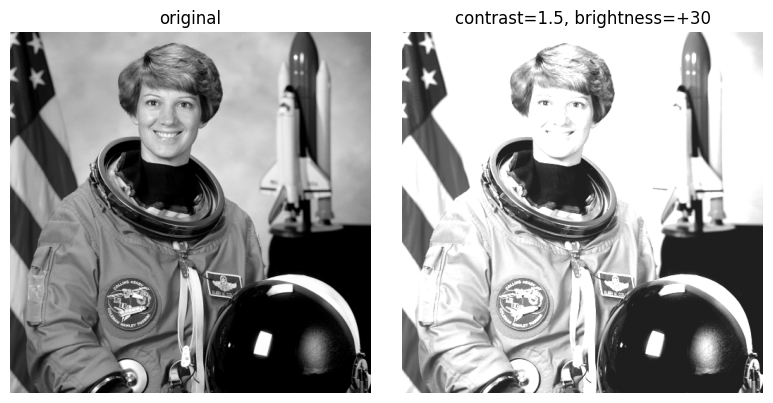

In [5]:
def adjust(image, contrast, brightness):
    out = contrast * image.astype(np.float32) + brightness
    out = np.clip(out, 0, 255)
    return out.astype(np.uint8)

result = adjust(gray, contrast=1.5, brightness=30)

fig, axes = plt.subplots(1, 2, figsize=(8, 4))
axes[0].imshow(gray,   cmap="gray", vmin=0, vmax=255); axes[0].set_title("original")
axes[1].imshow(result, cmap="gray", vmin=0, vmax=255); axes[1].set_title("contrast=1.5, brightness=+30")
for ax in axes: ax.axis("off")
plt.tight_layout(); plt.show()


## A2 · Color images, channels & color spaces

> *Lecture recap:* a color image is a **3D cube** — width × height × **depth**,
> where depth is the number of color channels. RGB has depth 3. **HSV** is
> useful because **Value** directly represents brightness (great for object
> tracking / color thresholding / OpenCV masking), while **HLS**'s Lightness
> behaves more perceptually balanced (useful for lane detection, illumination
> analysis). OpenCV stores loaded images as **BGR**, not RGB — a classic
> gotcha.


each channel shape: (512, 512)  -- a 2D array of 0..255 values


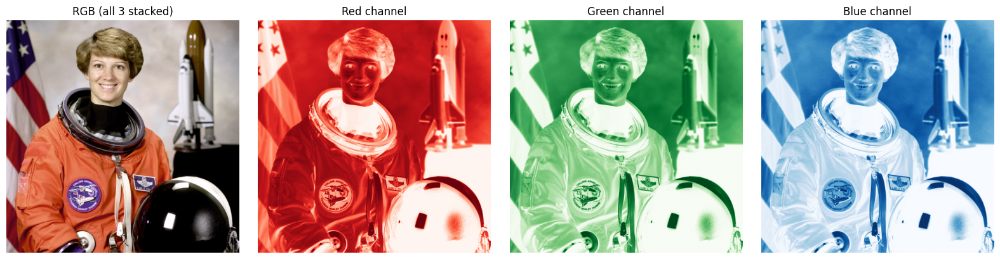

In [7]:
# TODO -- split the RGB image into its three channels and display them.
R, G, B =img_rgb[:, :, 0], img_rgb[:, :, 1], img_rgb[:, :, 2]
print("each channel shape:", R.shape, " -- a 2D array of 0..255 values")

fig, axes = plt.subplots(1, 4, figsize=(16, 4))
axes[0].imshow(img_rgb);        axes[0].set_title("RGB (all 3 stacked)")
axes[1].imshow(R, cmap="Reds"); axes[1].set_title("Red channel")
axes[2].imshow(G, cmap="Greens"); axes[2].set_title("Green channel")
axes[3].imshow(B, cmap="Blues"); axes[3].set_title("Blue channel")
for ax in axes: ax.axis("off")
plt.tight_layout(); plt.show()


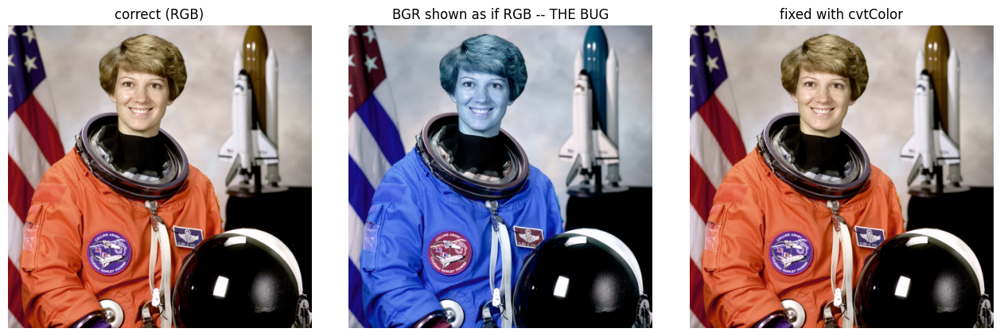

In [8]:
# TODO -- demonstrate the BGR vs RGB gotcha.
# Step 1: simulate what cv2.imread() would give us -- same image, channel
#         axis reversed (RGB -> BGR). Hint: img_rgb[:, :, ::-1]
# Step 2: show the BGR image as if it were RGB -- this IS the bug.
# Step 3: fix with cv2.cvtColor and the right BGR2RGB flag.

img_bgr = img_rgb[:, :, ::-1]
fixed   = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

fig, axes = plt.subplots(1, 3, figsize=(13, 4.2))
axes[0].imshow(img_rgb); axes[0].set_title("correct (RGB)")
axes[1].imshow(img_bgr); axes[1].set_title("BGR shown as if RGB -- THE BUG")
axes[2].imshow(fixed);   axes[2].set_title("fixed with cvtColor")
for ax in axes: ax.axis("off")
plt.tight_layout(); plt.show()


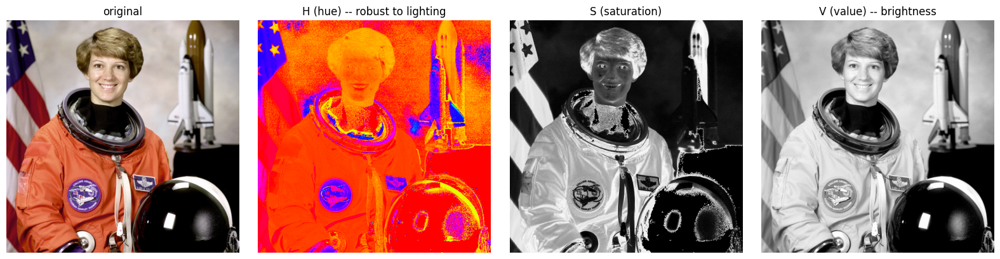

In [9]:
# TODO -- convert img_rgb to HSV, then split into H, S, V.
# OpenCV: cv2.COLOR_RGB2HSV. Reminder: H is 0-179, S and V are 0-255 in OpenCV.

hsv =cv2.cvtColor(img_rgb, cv2.COLOR_RGB2HSV)
H, S, V =hsv[:,:,0], hsv[:,:,1], hsv[:,:,2]

fig, axes = plt.subplots(1, 4, figsize=(16, 4))
axes[0].imshow(img_rgb);        axes[0].set_title("original")
axes[1].imshow(H, cmap="hsv");  axes[1].set_title("H (hue) -- robust to lighting")
axes[2].imshow(S, cmap="gray"); axes[2].set_title("S (saturation)")
axes[3].imshow(V, cmap="gray"); axes[3].set_title("V (value) -- brightness")
for ax in axes: ax.axis("off")
plt.tight_layout(); plt.show()


### TODO A2.1
The lecture asks: *to discriminate cats from dogs by fur color, should you use
grayscale or RGB, and why?* Answer in a comment. Then implement the three
RGB→grayscale formulas by hand and compare to OpenCV:

- **Lightness:** `(max(R,G,B) + min(R,G,B)) / 2`
- **Average:** `(R + G + B) / 3`
- **Luminosity** (best — matches human vision, most sensitive to green):
  `0.21*R + 0.72*G + 0.07*B`


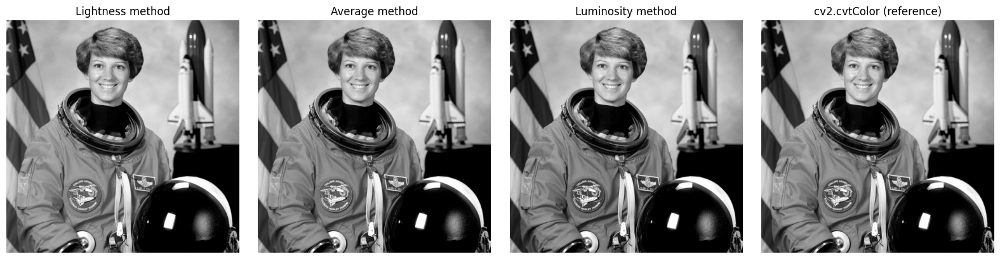

In [11]:
# Written answer (in this comment): grayscale or RGB for cats vs dogs, and why?
#   -> use RGB for cats vs dogs because fur color is important for distinguishing cats from dogs

Rf = R.astype(np.float32); Gf = G.astype(np.float32); Bf = B.astype(np.float32)

lightness  =(np.maximum(np.maximum(R,G),B).astype(np.float32) + np.minimum(np.minimum(R,G),B).astype(np.float32)) / 2
average    =(Rf + Gf + Bf) / 3
luminosity = 0.21*Rf + 0.72*Gf + 0.07*Bf
cv_gray    = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)

fig, axes = plt.subplots(1, 4, figsize=(16, 4))
axes[0].imshow(lightness,  cmap="gray", vmin=0, vmax=255); axes[0].set_title("Lightness method")
axes[1].imshow(average,    cmap="gray", vmin=0, vmax=255); axes[1].set_title("Average method")
axes[2].imshow(luminosity, cmap="gray", vmin=0, vmax=255); axes[2].set_title("Luminosity method")
axes[3].imshow(cv_gray,    cmap="gray", vmin=0, vmax=255); axes[3].set_title("cv2.cvtColor (reference)")
for ax in axes: ax.axis("off")
plt.tight_layout(); plt.show()


## A3 · Color thresholding — selecting a region of interest

> *Lecture recap:* a **color threshold** isolates a region by keeping only
> pixels whose color falls in a chosen range — classic example: a green
> screen. A plain RGB threshold breaks under changing light; thresholding in
> **HSV** is more robust because hue stays fairly stable under lighting
> changes.

We build a synthetic "green screen" scene so this is fully offline and
reproducible.


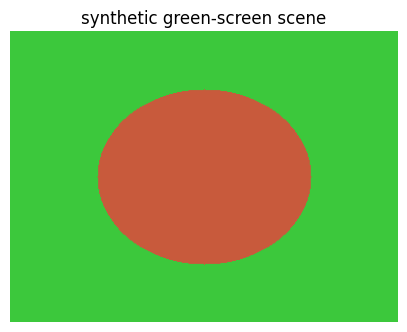

In [12]:
# Build a synthetic green-screen scene: a colored circular "subject" on a
# green background, entirely in code (no downloads needed).
scene = np.zeros((300, 400, 3), dtype=np.uint8)
scene[:, :] = (60, 200, 60)                          # green background (RGB)
yy, xx = np.ogrid[:300, :400]
subject_mask_gt = (xx - 200) ** 2 / 110 ** 2 + (yy - 150) ** 2 / 90 ** 2 <= 1
scene[subject_mask_gt] = (200, 90, 60)                # orange-ish "subject"

plt.figure(figsize=(5, 4))
plt.imshow(scene)
plt.title("synthetic green-screen scene")
plt.axis("off")
plt.show()


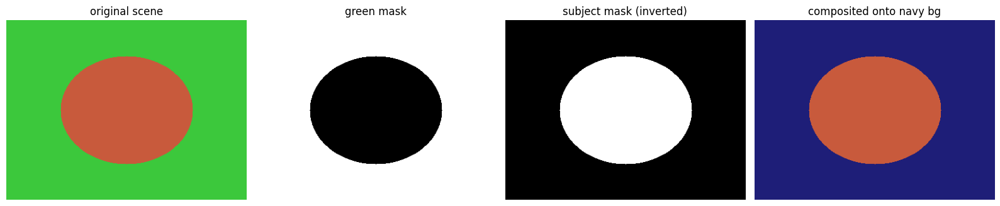

In [13]:
# TODO -- chroma-key (green-screen) the `scene`.
#  1) Convert scene to HSV.
#  2) Build a binary mask of "green" pixels with cv2.inRange. Green in OpenCV
#     HSV is roughly H in [35, 85], S/V both >= 40.
#  3) INVERT the mask (cv2.bitwise_not) -- keep the subject, i.e. NOT green.
#  4) Build a navy background and composite with np.where.

scene_hsv =cv2.cvtColor(scene, cv2.COLOR_RGB2HSV)
lower_green = np.array([35, 40, 40])
upper_green = np.array([85, 255, 255])
green_mask =cv2.inRange(scene_hsv, lower_green, upper_green)
subject_mask =cv2.bitwise_not(green_mask)

navy_bg = np.full_like(scene, (30, 30, 120))
composited =np.where(subject_mask[:,:,None]==255, scene, navy_bg)

fig, axes = plt.subplots(1, 4, figsize=(16, 4))
axes[0].imshow(scene);                        axes[0].set_title("original scene")
axes[1].imshow(green_mask, cmap="gray");      axes[1].set_title("green mask")
axes[2].imshow(subject_mask, cmap="gray");    axes[2].set_title("subject mask (inverted)")
axes[3].imshow(composited);                   axes[3].set_title("composited onto navy bg")
for ax in axes: ax.axis("off")
plt.tight_layout(); plt.show()


## A4 · Morphological operations — cleaning binary masks

Real masks are never clean — stray pixels, small holes, jagged edges.

- **Erosion** shrinks white regions — kills bright noise, thins connections.
- **Dilation** grows white regions — fills small holes, thickens lines.
- **Opening** (erode→dilate): kills noise *without* shrinking the object.
- **Closing** (dilate→erode): fills holes *without* growing the object.


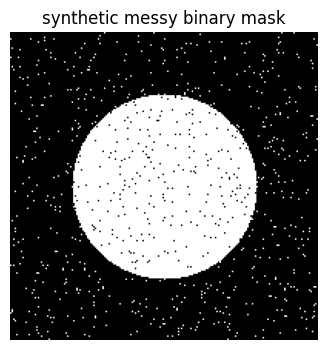

In [14]:
# Build a synthetic "messy" binary mask: a disk with salt-and-pepper noise.
rng = np.random.default_rng(1)
messy = np.zeros((200, 200), dtype=np.uint8)
yy, xx = np.ogrid[:200, :200]
messy[(xx - 100) ** 2 + (yy - 100) ** 2 <= 60 ** 2] = 255
salt = rng.random((200, 200)) < 0.02
pepper = rng.random((200, 200)) < 0.02
messy[salt] = 255
messy[pepper & (messy == 255)] = 0

plt.figure(figsize=(4, 4))
plt.imshow(messy, cmap="gray")
plt.title("synthetic messy binary mask")
plt.axis("off")
plt.show()


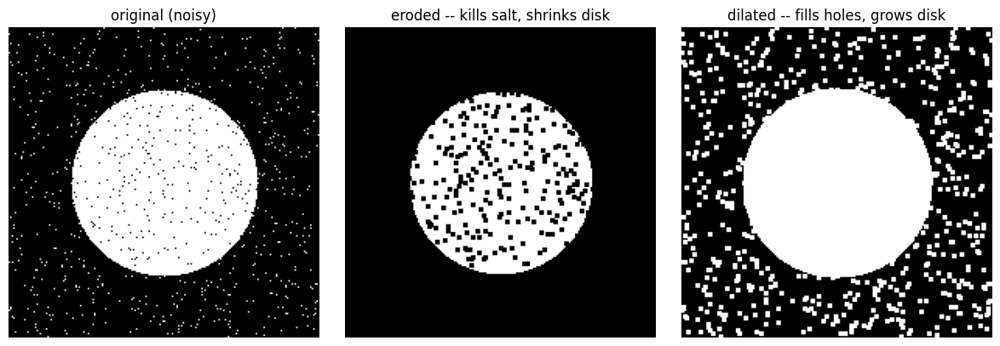

In [15]:
# TODO -- erosion and dilation, the two morphology atoms.
# Build a 3x3 SQUARE structuring element, then apply cv2.erode / cv2.dilate
# with iterations=1.

kernel =cv2.getStructuringElement(cv2.MORPH_RECT, (3,3))
eroded  =cv2.erode(messy, kernel, iterations=1)
dilated =cv2.dilate(messy, kernel, iterations=1)

fig, axes = plt.subplots(1, 3, figsize=(12, 4))
axes[0].imshow(messy,   cmap="gray"); axes[0].set_title("original (noisy)")
axes[1].imshow(eroded,  cmap="gray"); axes[1].set_title("eroded -- kills salt, shrinks disk")
axes[2].imshow(dilated, cmap="gray"); axes[2].set_title("dilated -- fills holes, grows disk")
for ax in axes: ax.axis("off")
plt.tight_layout(); plt.show()


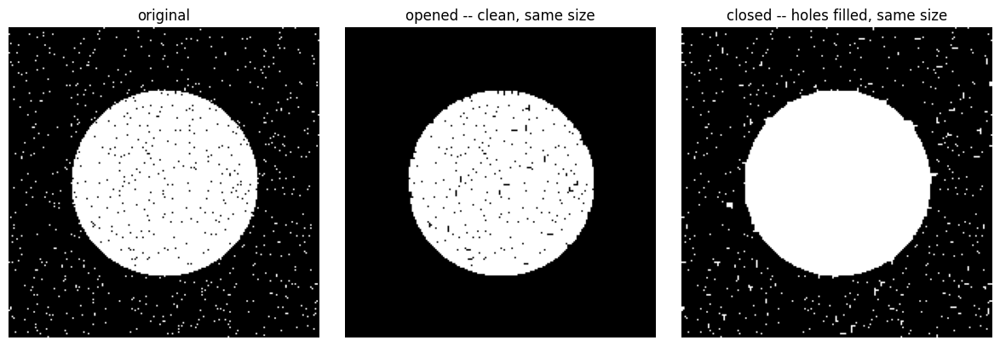

In [16]:
# TODO -- opening and closing, the workhorses.
# OPENING = erode -> dilate   (kills noise WITHOUT shrinking the object)
# CLOSING = dilate -> erode   (fills holes WITHOUT growing the object)
# Use cv2.morphologyEx with cv2.MORPH_OPEN / cv2.MORPH_CLOSE.

opened =cv2.morphologyEx(messy, cv2.MORPH_OPEN, kernel)
closed =cv2.morphologyEx(messy, cv2.MORPH_CLOSE, kernel)

fig, axes = plt.subplots(1, 3, figsize=(12, 4))
axes[0].imshow(messy,  cmap="gray"); axes[0].set_title("original")
axes[1].imshow(opened, cmap="gray"); axes[1].set_title("opened -- clean, same size")
axes[2].imshow(closed, cmap="gray"); axes[2].set_title("closed -- holes filled, same size")
for ax in axes: ax.axis("off")
plt.tight_layout(); plt.show()


### TODO A4.1
Scanned-document scenario: black text on white paper, so the **object is the
dark region** — erosion/dilation/open/close roles are **flipped** relative to
the white-disk example above. There are:
- **Stray dark specks** in the white background (scanner dust).
- **Small gaps** inside thick dark strokes (scanner missed pixels).

Pick the right operation for each and chain them into a `clean` mask.


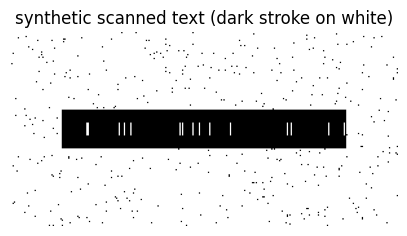

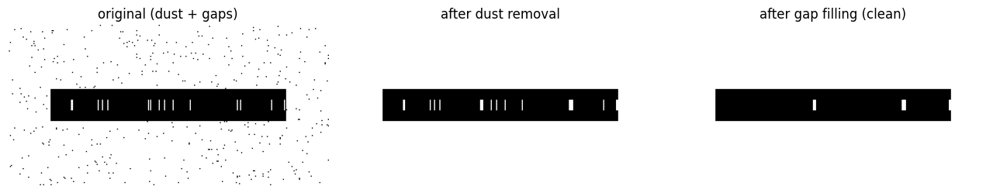

In [17]:
# Build a synthetic "text" mask: dark strokes on white, with dust + gaps.
rng = np.random.default_rng(2)
text_mask = np.full((150, 300), 255, dtype=np.uint8)
text_mask[60:90, 40:260] = 0                          # a thick dark "stroke"
dust = rng.random((150, 300)) < 0.01
text_mask[dust] = 0                                    # dark specks on background
gap_idx = rng.choice(np.arange(40, 260), size=15, replace=False)
text_mask[70:80, gap_idx] = 255                        # gaps inside the stroke

plt.figure(figsize=(5, 3))
plt.imshow(text_mask, cmap="gray")
plt.title("synthetic scanned text (dark stroke on white)")
plt.axis("off")
plt.show()

# Hint: when the OBJECT is dark, "open"/"close" names still refer to the
# WHITE region, so their EFFECT on the dark object swaps:
#   * MORPH_CLOSE on this image (dilate white -> erode white) shrinks dark
#     specks in the white background -- removes the dust.
#   * MORPH_OPEN on this image (erode white -> dilate white) grows white
#     regions that were pinched thin -- fills small dark gaps in the stroke.

step1 =cv2.morphologyEx(text_mask, cv2.MORPH_CLOSE, kernel)  #-- remove dust
clean =cv2.morphologyEx(step1, cv2.MORPH_OPEN, kernel)        #-- fill stroke gaps

fig, axes = plt.subplots(1, 3, figsize=(13, 3.5))
axes[0].imshow(text_mask, cmap="gray"); axes[0].set_title("original (dust + gaps)")
axes[1].imshow(step1,     cmap="gray"); axes[1].set_title("after dust removal")
axes[2].imshow(clean,     cmap="gray"); axes[2].set_title("after gap filling (clean)")
for ax in axes: ax.axis("off")
plt.tight_layout(); plt.show()


## A5 · Convolution, high-pass filters, and Sobel gradients

> *Lecture recap:* a **filter** is a small matrix (a convolution **kernel**).
> Convolution slides the kernel over the image; at each position it multiplies
> kernel weights by the underlying patch and sums, producing one output pixel.
> For an **edge-detection (high-pass) kernel the weights must sum to zero** —
> the filter computes a *difference*, and non-zero sum would brighten/darken
> the whole image uniformly. The **Sobel** operator uses two such kernels (one
> per axis) to get gradients `Gx`, `Gy`; combine into **magnitude =
> √(Gx²+Gy²)** and **direction = atan(Gy/Gx)**.


edge kernel:
 [[ 0. -1.  0.]
 [-1.  4. -1.]
 [ 0. -1.  0.]]
sum of weights: 0.0  <- MUST be 0


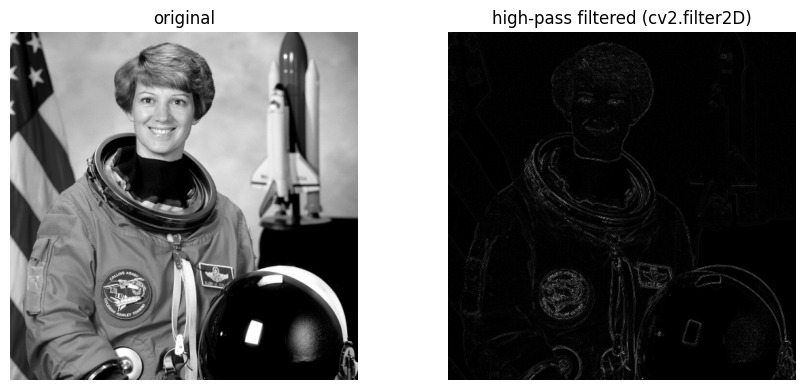

In [18]:
# TODO -- build the classic 3x3 high-pass (edge-detection) kernel.
# Center = +4, the 4-neighbours = -1, the 4 corners = 0.
# Weights MUST sum to 0 for an edge detector.

edge_kernel =np.array([[0,-1,0],[-1,4,-1],[0,-1,0]], dtype=np.float32)
print("edge kernel:\n", edge_kernel)
print("sum of weights:", edge_kernel.sum(), " <- MUST be 0")

edges_cv = cv2.filter2D(gray.astype(np.float32), -1, edge_kernel, borderType=cv2.BORDER_REPLICATE)

fig, axes = plt.subplots(1, 2, figsize=(9, 4))
axes[0].imshow(gray, cmap="gray", vmin=0, vmax=255); axes[0].set_title("original")
axes[1].imshow(np.abs(edges_cv), cmap="gray");        axes[1].set_title("high-pass filtered (cv2.filter2D)")
for ax in axes: ax.axis("off")
plt.tight_layout(); plt.show()


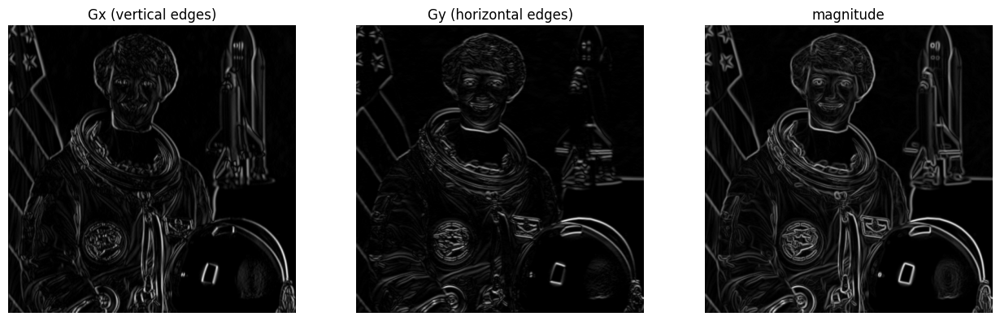

In [19]:
def convolve2d(image, kernel, edge="extend"):
    'A teaching-grade 2D convolution. In real code, use cv2.filter2D.'
    kh, kw = kernel.shape
    pad_h, pad_w = kh // 2, kw // 2
    padded = np.pad(image, ((pad_h, pad_h), (pad_w, pad_w)),
                     mode="edge" if edge == "extend" else "constant")
    out = np.zeros_like(image, dtype=np.float32)
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            patch = padded[i:i + kh, j:j + kw]
            out[i, j] = np.sum(patch * kernel)
    return out

gray_smooth = cv2.GaussianBlur(gray, (5, 5), 1.0)

# TODO -- build the two Sobel kernels by hand and get Gx, Gy via convolve2d.
sobel_x =np.array([[-1,0,1],[-2,0,2],[-1,0,1]], dtype=np.float32)
sobel_y =np.array([[-1,-2,-1],[0,0,0],[1,2,1]], dtype=np.float32)

Gx = convolve2d(gray_smooth.astype(np.float32), sobel_x)
Gy = convolve2d(gray_smooth.astype(np.float32), sobel_y)
magnitude =np.sqrt(Gx**2 + Gy**2)
direction = np.arctan2(Gy, Gx)

fig, axes = plt.subplots(1, 3, figsize=(13, 4))
axes[0].imshow(np.abs(Gx), cmap="gray"); axes[0].set_title("Gx (vertical edges)")
axes[1].imshow(np.abs(Gy), cmap="gray"); axes[1].set_title("Gy (horizontal edges)")
axes[2].imshow(magnitude,  cmap="gray"); axes[2].set_title("magnitude")
for ax in axes: ax.axis("off")
plt.tight_layout(); plt.show()


### TODO A5.1
Threshold the Sobel magnitude into a clean **binary edge map**: pixels above a
value become edges (white), the rest background (black). Write
`edge_map(magnitude, threshold)` and show low / medium / high thresholds to
see the trade-off.


magnitude range: 0.0 to 659.4619


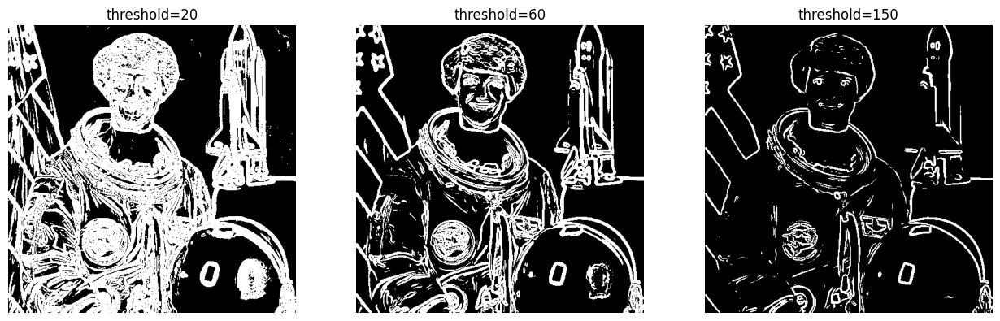

In [20]:
def edge_map(magnitude, threshold):
    return(magnitude > threshold).astype(np.uint8) * 255

print("magnitude range:", magnitude.min(), "to", magnitude.max())

fig, axes = plt.subplots(1, 3, figsize=(13, 4))
for ax, thr in zip(axes, [20, 60, 150]):            # e.g. 20, 60, 150 -- low, medium, high
    em = edge_map(magnitude, thr)
    ax.imshow(em, cmap="gray"); ax.set_title(f"threshold={thr}")
    ax.axis("off")
plt.tight_layout(); plt.show()


## A6 · Low-pass filters — averaging, Gaussian, and median

> *Lecture recap:* **low-pass filters** block high-frequency content — they
> blur/smooth an image and reduce noise. Unlike an edge kernel, a low-pass
> kernel's weights **must sum to 1** (preserve overall brightness). The
> **median filter** is nonlinear (no weighted sum — it picks the median in a
> window) and is uniquely good against salt-and-pepper noise.


box kernel sum: 1.0  <- MUST be 1


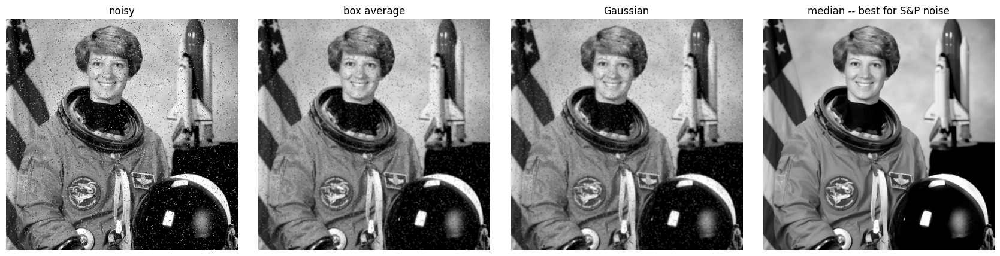

In [21]:
# Build a noisy version of `gray` with salt-and-pepper noise.
rng = np.random.default_rng(3)
noisy = gray.copy()
salt = rng.random(gray.shape) < 0.02
pepper = rng.random(gray.shape) < 0.02
noisy[salt] = 255
noisy[pepper] = 0

# TODO -- box filter (weights must sum to 1) vs Gaussian vs median.
box_kernel =np.ones((3,3), dtype=np.float32) / 9
print("box kernel sum:", box_kernel.sum(), " <- MUST be 1")

averaged =convolve2d(noisy.astype(np.float32), box_kernel)
gaussian =cv2.GaussianBlur(noisy, (5,5), sigmaX=1.0)
median   =cv2.medianBlur(noisy, 3)

fig, axes = plt.subplots(1, 4, figsize=(17, 4.2))
axes[0].imshow(noisy,    cmap="gray", vmin=0, vmax=255); axes[0].set_title("noisy")
axes[1].imshow(averaged, cmap="gray", vmin=0, vmax=255); axes[1].set_title("box average")
axes[2].imshow(gaussian, cmap="gray", vmin=0, vmax=255); axes[2].set_title("Gaussian")
axes[3].imshow(median,   cmap="gray", vmin=0, vmax=255); axes[3].set_title("median -- best for S&P noise")
for ax in axes: ax.axis("off")
plt.tight_layout(); plt.show()


## A7 · Canny edge detection

> *Lecture recap:* Canny combines what we've built: **Gaussian blur** → Sobel
> gradients → **non-maximum suppression** (thin edges to local maxima along
> the gradient direction) → **hysteresis** (double threshold: strong edges kept
> outright, weak edges kept only if connected to a strong one).


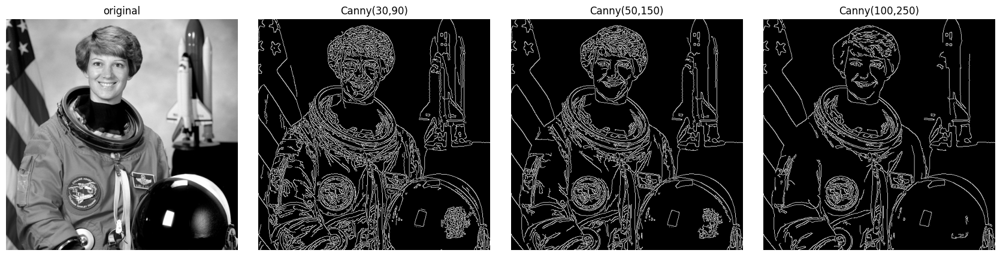

In [24]:
# TODO -- run Canny with THREE different (low, high) threshold pairs.
# Rule of thumb: high:low ratio ~ 2:1 to 3:1.

fig, axes = plt.subplots(1, 4, figsize=(17, 4.2))
axes[0].imshow(gray, cmap="gray"); axes[0].set_title("original"); axes[0].axis("off")

threshold_pairs = [(30,90), (50,150), (100,250)]                     # e.g. (30,90), (50,150), (100,250)
for ax, (lo, hi) in zip(axes[1:], threshold_pairs):
    edges =cv2.Canny(gray, lo, hi)
    ax.imshow(edges, cmap="gray"); ax.set_title(f"Canny({lo},{hi})"); ax.axis("off")
plt.tight_layout(); plt.show()


## A8 · Geometric transforms — translate, rotate, scale

OpenCV expresses these with **2×3 affine matrices** fed to `cv2.warpAffine`.


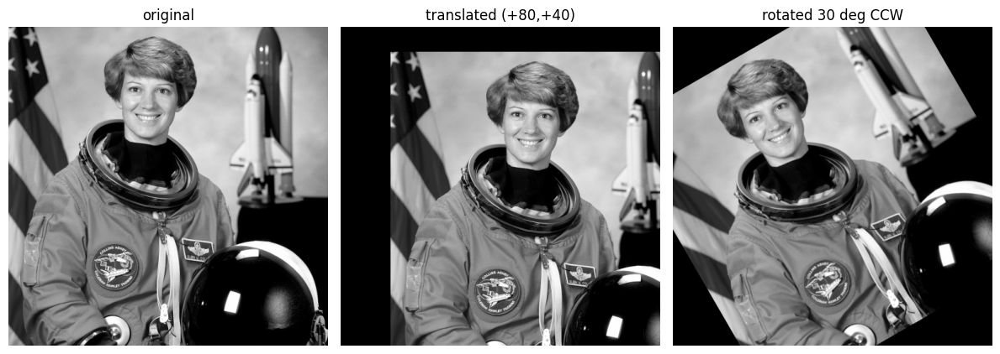

In [25]:
# TODO -- translation and rotation.
h, w = gray.shape

M_translate =np.float32([[1,0,80],[0,1,40]])
translated =cv2.warpAffine(gray, M_translate, (w, h))

M_rotate = cv2.getRotationMatrix2D(center=(w // 2, h // 2), angle=30, scale=1.0)
rotated =cv2.warpAffine(gray, M_rotate, (w, h))

fig, axes = plt.subplots(1, 3, figsize=(12, 4.5))
axes[0].imshow(gray,       cmap="gray"); axes[0].set_title("original")
axes[1].imshow(translated, cmap="gray"); axes[1].set_title("translated (+80,+40)")
axes[2].imshow(rotated,    cmap="gray"); axes[2].set_title("rotated 30 deg CCW")
for ax in axes: ax.axis("off")
plt.tight_layout(); plt.show()


### TODO A8.1
Produce an image **rotated 45° AND scaled to 70%** in **one** `warpAffine`
call (`cv2.getRotationMatrix2D` takes a `scale` argument directly). Then
answer in a comment: if rotation and translation were done as two *separate*
`warpAffine` calls, would the order matter?


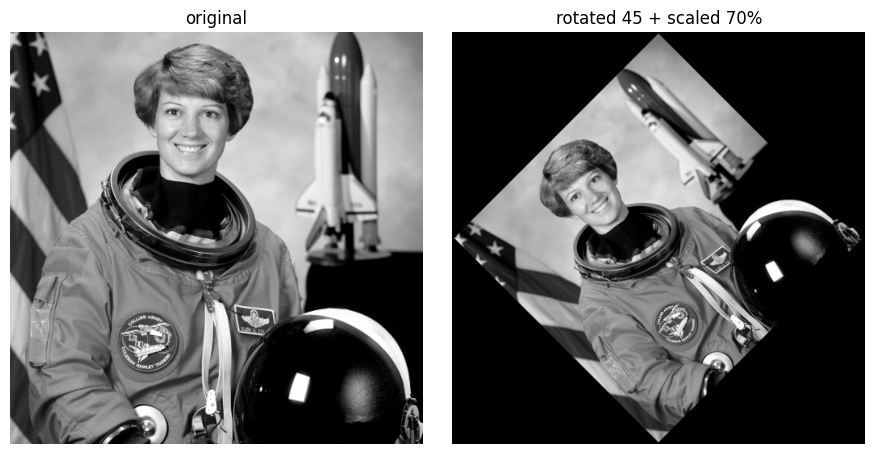

In [27]:
M = cv2.getRotationMatrix2D(center=(w // 2, h // 2), angle=45, scale=0.7)
rot_and_scaled = cv2.warpAffine(gray, M, (w, h))

fig, axes = plt.subplots(1, 2, figsize=(9, 4.5))
axes[0].imshow(gray,           cmap="gray"); axes[0].set_title("original")
axes[1].imshow(rot_and_scaled, cmap="gray"); axes[1].set_title("rotated 45 + scaled 70%")
for ax in axes: ax.axis("off")
plt.tight_layout(); plt.show()

# Written answer: does order matter for separate rotate + translate calls?
#   ->Yes, order matters because the second transformation is applied to the result of the first transformation.


## A9 · Histograms & histogram equalization

> *Lecture recap:* a **histogram** plots pixel count vs intensity. A narrow
> histogram = low contrast; one spread across 0–255 = high contrast. **Global
> equalization** redistributes intensities via the cumulative distribution
> function. Its weakness: it equalizes using the *whole* image's histogram, so
> a locally dark region in an otherwise bright photo stays dark — **CLAHE**
> (Contrast Limited Adaptive Histogram Equalization) fixes this by equalizing
> small tiles independently.


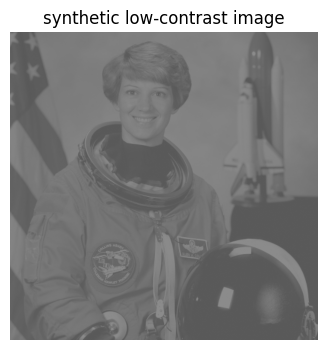

In [28]:
# Build a synthetic low-contrast image (compress gray's range to [90,140]).
low_contrast = (90 + (gray.astype(np.float32) / 255.0) * 50).astype(np.uint8)

plt.figure(figsize=(4, 4))
plt.imshow(low_contrast, cmap="gray", vmin=0, vmax=255)
plt.title("synthetic low-contrast image")
plt.axis("off")
plt.show()


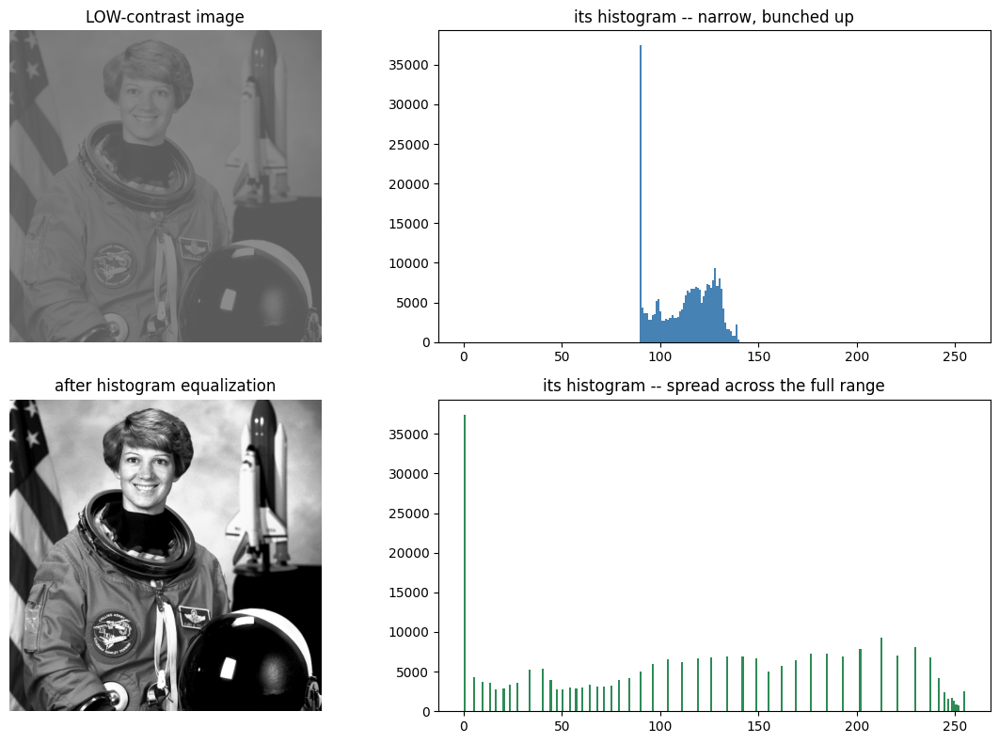

In [29]:
# TODO -- demonstrate global histogram equalization.
equalized =cv2.equalizeHist(low_contrast)

fig, axes = plt.subplots(2, 2, figsize=(12, 8))
axes[0, 0].imshow(low_contrast, cmap="gray", vmin=0, vmax=255)
axes[0, 0].set_title("LOW-contrast image"); axes[0, 0].axis("off")
axes[0, 1].hist(low_contrast.ravel(), bins=256, range=(0, 255), color="steelblue")
axes[0, 1].set_title("its histogram -- narrow, bunched up")

axes[1, 0].imshow(equalized, cmap="gray", vmin=0, vmax=255)
axes[1, 0].set_title("after histogram equalization"); axes[1, 0].axis("off")
axes[1, 1].hist(equalized.ravel(), bins=256, range=(0, 255), color="seagreen")
axes[1, 1].set_title("its histogram -- spread across the full range")
plt.tight_layout(); plt.show()


### TODO A9.1
Apply both `cv2.equalizeHist` and `cv2.createCLAHE` to the **original `gray`**
image and compare all three side by side.


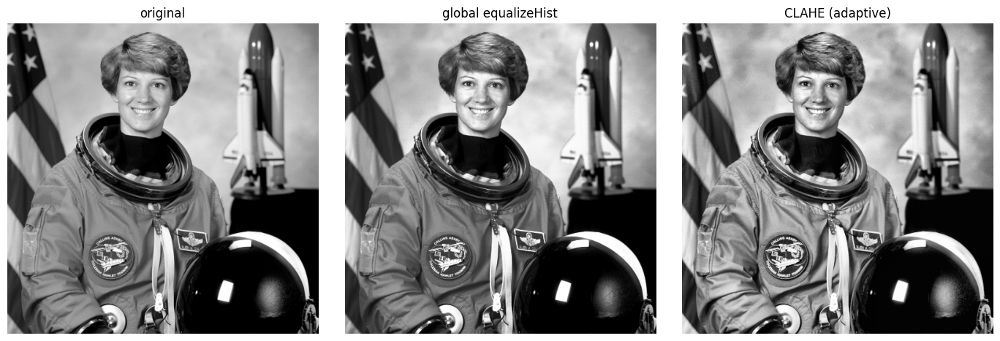

In [30]:
global_eq = cv2.equalizeHist(gray)
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
clahe_eq =clahe.apply(gray)

fig, axes = plt.subplots(1, 3, figsize=(14, 4.6))
axes[0].imshow(gray,      cmap="gray", vmin=0, vmax=255); axes[0].set_title("original")
axes[1].imshow(global_eq, cmap="gray", vmin=0, vmax=255); axes[1].set_title("global equalizeHist")
axes[2].imshow(clahe_eq,  cmap="gray", vmin=0, vmax=255); axes[2].set_title("CLAHE (adaptive)")
for ax in axes: ax.axis("off")
plt.tight_layout(); plt.show()

# Written answer: where does CLAHE look better, and what is clipLimit for?
#   -> # CLAHE looks better in areas with uneven lighting and local details.
# clipLimit controls the amount of contrast enhancement and prevents
# over-amplification of noise.


---
# Part B · Neural Network & CNN Foundations

Now we move from classical pixel operations to the learning-based pipeline:
neurons, activations, initialization, batch norm, residuals,
overfitting/underfitting, and finally the CNN building blocks — convolution,
padding, stride, and pooling — built from scratch before using PyTorch.


## B1 · A single neuron and a tiny MLP

> *Lecture recap:* a **neuron** computes a weighted sum of its inputs plus a
> bias, then passes it through a non-linear **activation function**. Stacking
> neurons into layers gives a **Multi-Layer Perceptron (MLP)**. Key
> **hyperparameters**: number of layers, number of neurons, learning rate,
> batch size, optimizer, number of iterations.


In [31]:
# TODO -- implement a single neuron's forward pass: z = w . x + b, then
# apply a sigmoid activation a = 1 / (1 + exp(-z)).

def sigmoid(z):
    return 1 / (1 + np.exp(-z))

x = np.array([0.5, -0.2, 0.8])
w = np.array([0.4, 0.9, -0.3])
b = 0.1

z =  np.dot(w, x) + b
a = sigmoid(z)
print(f"z (weighted sum) = {z:.4f}")
print(f"a (after sigmoid) = {a:.4f}")


z (weighted sum) = -0.1200
a (after sigmoid) = 0.4700


### TODO B1.1
Build a tiny 2-layer MLP forward pass by hand: input size 3 → hidden size 4
(ReLU) → output size 1 (sigmoid). Use small random weights.


In [32]:
def relu(z):
    return np.maximum(0, z)

rng = np.random.default_rng(0)
W1 = rng.normal(0, 0.5, size=(4, 3))   # hidden_size x input_size
b1 = np.zeros(4)
W2 = rng.normal(0, 0.5, size=(1, 4))   # output_size x hidden_size
b2 = np.zeros(1)

x = np.array([0.5, -0.2, 0.8])

h_pre =W1 @ x + b1
h = relu(h_pre)
out_pre =W2 @ h + b2
out = sigmoid(out_pre)

print("hidden pre-activation:", h_pre)
print("hidden after ReLU:    ", h)
print("final output:          ", out)


hidden pre-activation: [ 0.3008121   0.22442999 -0.05020218 -0.23749753]
hidden after ReLU:     [0.3008121  0.22442999 0.         0.        ]
final output:           [0.40751438]


## B2 · Activation functions

> *Lecture recap:* activation functions take any real number as input and
> output a value in a bounded (or semi-bounded) range using a **non-linear,
> differentiable** function. Without non-linearity, stacking layers would
> collapse into one big linear function — no matter how deep.


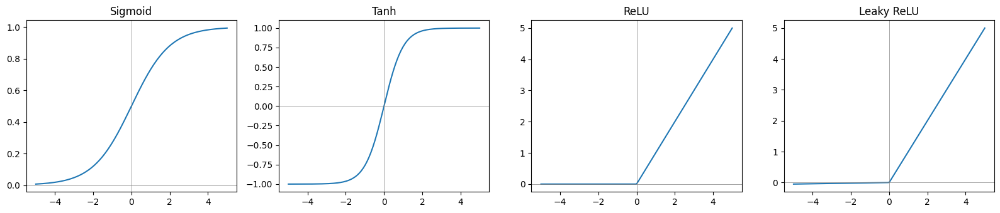

In [33]:
# TODO -- implement sigmoid, tanh, relu, and leaky_relu, then plot all four.

def sigmoid_(z): return 1 / (1 + np.exp(-z))
def tanh_(z):    return np.tanh(z)
def relu_(z):    return np.maximum(0, z)
def leaky_relu_(z, alpha=0.01): return  np.where(z > 0, z, alpha * z)

zs = np.linspace(-5, 5, 200)
fig, axes = plt.subplots(1, 4, figsize=(16, 3.5))
for ax, (name, fn) in zip(axes, [("Sigmoid", sigmoid_), ("Tanh", tanh_),
                                  ("ReLU", relu_), ("Leaky ReLU", leaky_relu_)]):
    ax.plot(zs, fn(zs)); ax.axhline(0, color="gray", lw=0.5); ax.axvline(0, color="gray", lw=0.5)
    ax.set_title(name)
plt.tight_layout(); plt.show()


## B3 · Vanishing & exploding gradients, and how we stabilize them

> *Lecture recap:* deep networks suffer from **vanishing** (gradients shrink
> to ~0 through many layers, early layers stop learning) or **exploding**
> (gradients blow up, training diverges) gradients. Three stabilizers:
> 1. **Good initialization** — preserves signal magnitude across layers.
> 2. **Activation function choice** — saturating functions (sigmoid/tanh) are
>    more prone to vanishing gradients than ReLU-family functions.
> 3. **Batch normalization** — normalizes activations to mean 0, variance 1
>    per batch, then applies learnable scale (γ) and shift (β).
> 4. **Residual connections** — an identity shortcut lets gradients flow
>    directly backward, sidestepping vanishing through many layers.

Let's *see* vanishing gradients happen with poor vs. good initialization.


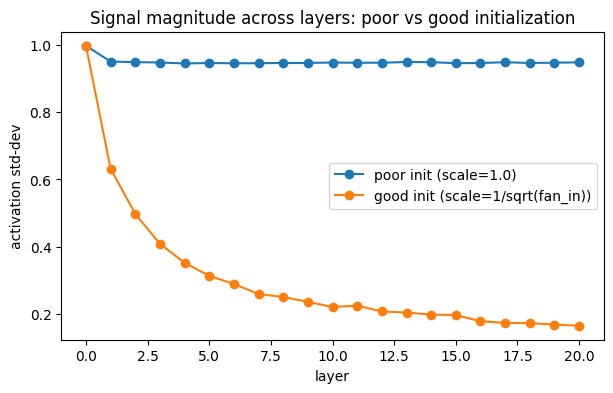

In [34]:
# TODO -- simulate signal magnitude through 20 layers of matmul + tanh,
# comparing a poor (too-large) initialization to a good (scaled) one.
# "Poor": weights ~ N(0, 1).  "Good" (Xavier-ish): weights ~ N(0, 1/sqrt(fan_in)).

def simulate_layers(n_layers, fan_in, fan_out, scale, n_trials=500, seed=0):
    rng = np.random.default_rng(seed)
    x = rng.normal(0, 1, size=(n_trials, fan_in))
    stds = [x.std()]
    for _ in range(n_layers):
        W = rng.normal(0, scale, size=(fan_in, fan_out))
        x = np.tanh(x @ W)
        stds.append(x.std())
        fan_in = fan_out
    return stds

poor_stds = simulate_layers(20, fan_in=64, fan_out=64, scale=1.0)      # scale=1.0 (too large)
good_stds = simulate_layers(20, fan_in=64, fan_out=64, scale=1/np.sqrt(64))      # scale=1/np.sqrt(64)

plt.figure(figsize=(7, 4))
plt.plot(poor_stds, marker="o", label="poor init (scale=1.0)")
plt.plot(good_stds, marker="o", label="good init (scale=1/sqrt(fan_in))")
plt.xlabel("layer"); plt.ylabel("activation std-dev"); plt.legend()
plt.title("Signal magnitude across layers: poor vs good initialization")
plt.show()


### TODO B3.1
Implement **batch normalization**'s forward pass by hand: given a batch of
activations, compute the mean and variance, normalize to mean 0 / variance 1,
then apply learnable scale `gamma` and shift `beta`.


before: mean=5.144, std=2.992
after:  mean=0.000, std=1.000


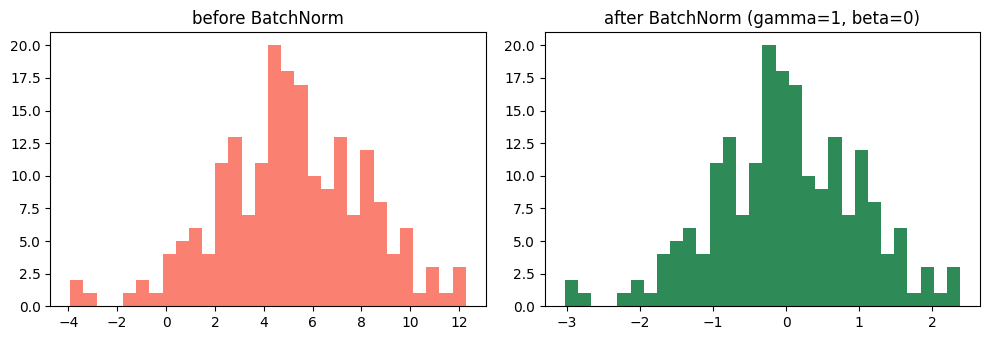

In [35]:
def batch_norm(x, gamma, beta, eps=1e-5):
    mean = x.mean(axis=0)
    var  =  x.var(axis=0)
    x_norm =  (x - mean) / np.sqrt(var + eps)
    out =  gamma * x_norm + beta
    return out, mean, var

rng = np.random.default_rng(4)
batch = rng.normal(loc=5.0, scale=3.0, size=(200, 1))   # activations NOT centered/scaled well
gamma, beta = np.array([1.0]), np.array([0.0])

normed, mean, var = batch_norm(batch, gamma, beta)
print(f"before: mean={batch.mean():.3f}, std={batch.std():.3f}")
print(f"after:  mean={normed.mean():.3f}, std={normed.std():.3f}")

fig, axes = plt.subplots(1, 2, figsize=(10, 3.5))
axes[0].hist(batch, bins=30, color="salmon");  axes[0].set_title("before BatchNorm")
axes[1].hist(normed, bins=30, color="seagreen"); axes[1].set_title("after BatchNorm (gamma=1, beta=0)")
plt.tight_layout(); plt.show()


### TODO B3.2
Implement a **residual (skip) connection**: `output = F(x) + x`, where `F` is
some small transformation. Compare gradient flow (conceptually) by showing
that even if `F(x)` were exactly zero, the identity path still passes `x`
through unchanged — this is why residual networks are easier to train deep.


In [36]:
def residual_block(x, W, b):
    Fx =  relu(x @ W + b)
    return  Fx + x   #-- the skip connection

rng = np.random.default_rng(5)
x = rng.normal(0, 1, size=(1, 8))
W = np.zeros((8, 8))   # deliberately a "dead" transformation -- F(x) = 0
b = np.zeros(8)

out = residual_block(x, W, b)
print("input:            ", np.round(x, 3))
print("F(x) contribution:", np.round(relu(x @ W + b), 3), " -- all zero (dead layer)")
print("block output:      ", np.round(out, 3), " -- IDENTICAL to input, thanks to the skip connection")


input:             [[-0.802 -1.324 -0.248  0.42   1.136  0.11  -0.553 -0.785]]
F(x) contribution: [[0. 0. 0. 0. 0. 0. 0. 0.]]  -- all zero (dead layer)
block output:       [[-0.802 -1.324 -0.248  0.42   1.136  0.11  -0.553 -0.785]]  -- IDENTICAL to input, thanks to the skip connection


## B4 · Overfitting, underfitting, and regularization

> *Lecture recap:* **underfitting** = model too simple / undertrained (fix:
> increase capacity, tune learning rate, check gradients). **Overfitting** =
> model memorizes training data, generalizes poorly (fix: dropout, data
> augmentation, better regularization). We'll see both on a toy regression
> problem by fitting polynomials of different degree.


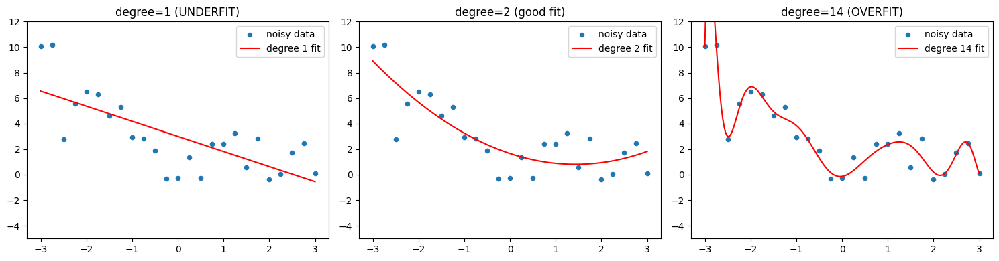

In [37]:
# Toy 1D regression: fit polynomials of increasing degree to noisy data and
# watch under/overfitting appear.
rng = np.random.default_rng(6)
x_data = np.linspace(-3, 3, 25)
y_true = 0.5 * x_data ** 2 - x_data + 1
y_data = y_true + rng.normal(0, 1.5, size=x_data.shape)

x_fine = np.linspace(-3, 3, 200)

# TODO -- fit a degree-1 (underfit), degree-2 (good fit), and degree-14
# (overfit) polynomial with np.polyfit / np.poly1d.
degrees = [1, 2, 14]
fig, axes = plt.subplots(1, 3, figsize=(15, 4))
for ax, deg in zip(axes, degrees):
    coeffs =np.polyfit(x_data, y_data, deg)
    poly = np.poly1d(coeffs)
    ax.scatter(x_data, y_data, s=20, label="noisy data")
    ax.plot(x_fine, poly(x_fine), color="red", label=f"degree {deg} fit")
    ax.set_ylim(-5, 12)
    label = "UNDERFIT" if deg == 1 else ("OVERFIT" if deg == 14 else "good fit")
    ax.set_title(f"degree={deg} ({label})")
    ax.legend()
plt.tight_layout(); plt.show()


### TODO B4.1
Implement **dropout**'s forward pass: at training time, randomly zero out a
fraction `p` of activations and scale the rest by `1/(1-p)` (inverted dropout,
so no rescaling is needed at test time).


In [38]:
def dropout(x, p, training=True, seed=None):
    if not training or p == 0:
        return x
    rng = np.random.default_rng(seed)
    mask = (rng.random(x.shape) > p).astype(np.float32)
    return x * mask / (1 - p)

x = np.ones((1, 10))
dropped = dropout(x, p=0.4, training=True, seed=0)
print("input:  ", x)
print("dropped:", np.round(dropped, 2))
print("kept fraction ~", (dropped > 0).mean(), " (expect ~0.6 for p=0.4)")


input:   [[1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]]
dropped: [[1.67 0.   0.   0.   1.67 1.67 1.67 1.67 1.67 1.67]]
kept fraction ~ 0.7  (expect ~0.6 for p=0.4)


## B5 · Convolution for CNNs — filters and feature maps

> *Lecture recap:* a CNN **filter** slides over the image; **Image + Filter →
> Feature Map**. A filter may learn to respond to edges, corners, textures,
> shapes, or object parts. This is the *same* convolution operation from Part
> A — but now the filter's weights are **learned**, not hand-designed.


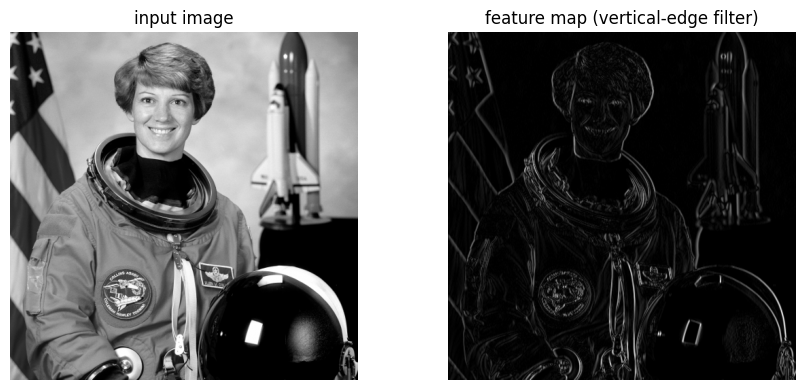

In [39]:
# TODO -- reuse convolve2d from Part A on `gray` with a hand-designed
# "vertical edge detector" filter, to connect classical convolution to what a
# CNN filter does (except a CNN LEARNS these weights instead of us setting them).

vertical_filter =  np.array([[1,0,-1],[1,0,-1],[1,0,-1]], dtype=np.float32)
feature_map = convolve2d(gray.astype(np.float32), vertical_filter)

fig, axes = plt.subplots(1, 2, figsize=(9, 4))
axes[0].imshow(gray, cmap="gray"); axes[0].set_title("input image")
axes[1].imshow(np.abs(feature_map), cmap="gray"); axes[1].set_title("feature map (vertical-edge filter)")
for ax in axes: ax.axis("off")
plt.tight_layout(); plt.show()


## B6 · Stride and padding

> *Lecture recap:* **Stride** controls how many pixels the filter moves each
> step — stride 1 visits every position; stride 2 skips every other position,
> halving (roughly) the output size and speeding up computation. **Padding**
> adds a border of pixels (usually zeros) around the image before convolving —
> without it, corner/edge pixels get visited far fewer times than center
> pixels, so information near the border is under-represented in the output.


In [40]:
# TODO -- implement a strided, padded convolution from scratch and confirm
# the output-size formula:  out = floor((in + 2*pad - k) / stride) + 1

def conv2d_strided(image, kernel, stride=1, pad=0):
    if pad > 0:
        image = np.pad(image, ((pad, pad), (pad, pad)), mode="constant")
    kh, kw = kernel.shape
    ih, iw = image.shape
    out_h = (ih - kh) // stride + 1
    out_w =  (iw - kw) // stride + 1
    out = np.zeros((out_h, out_w), dtype=np.float32)
    for i in range(out_h):
        for j in range(out_w):
            yi, xj = i * stride, j * stride
            patch = image[yi:yi + kh, xj:xj + kw]
            out[i, j] = np.sum(patch * kernel)
    return out

small = gray[::4, ::4].astype(np.float32)   # downsample for a fast demo
k3 = np.ones((3, 3), dtype=np.float32) / 9

no_pad_s1 = conv2d_strided(small, k3, stride=1, pad=0)
pad_s1    = conv2d_strided(small, k3, stride=1, pad=1)
pad_s2    = conv2d_strided(small, k3, stride=2, pad=1)

print("input shape:          ", small.shape)
print("stride=1, pad=0 shape:", no_pad_s1.shape, " -- shrinks")
print("stride=1, pad=1 shape:", pad_s1.shape,    " -- same size as input")
print("stride=2, pad=1 shape:", pad_s2.shape,    " -- roughly half")


input shape:           (128, 128)
stride=1, pad=0 shape: (126, 126)  -- shrinks
stride=1, pad=1 shape: (128, 128)  -- same size as input
stride=2, pad=1 shape: (64, 64)  -- roughly half


### TODO B6.1
Visualize the border-attention problem padding solves: for a 3×3 image and a
2×2 filter with stride 1, count **how many times each pixel is visited** by
the sliding window (no padding). Corners should be visited once; the center
more.


In [41]:
def visit_counts(img_shape, kernel_shape, stride=1, pad=0):
    ih, iw = img_shape
    kh, kw = kernel_shape
    if pad > 0:
        ih, iw = ih + 2 * pad, iw + 2 * pad
    counts = np.zeros((ih, iw), dtype=int)
    out_h = (ih - kh) // stride + 1
    out_w = (iw - kw) // stride + 1
    for i in range(out_h):
        for j in range(out_w):
            yi, xj = i * stride, j * stride
            counts[yi:yi + kh, xj:xj + kw]  += 1
    if pad > 0:
        counts = counts[pad:-pad, pad:-pad]
    return counts

counts_no_pad = visit_counts((3, 3), (2, 2), stride=1, pad=0)
print("visit counts, no padding (3x3 image, 2x2 filter, stride 1):\n", counts_no_pad)
print("\n-> corner pixels visited least, center visited most: information imbalance!")


visit counts, no padding (3x3 image, 2x2 filter, stride 1):
 [[1 2 1]
 [2 4 2]
 [1 2 1]]

-> corner pixels visited least, center visited most: information imbalance!


## B7 · Pooling and downsampling

> *Lecture recap:* pooling lowers spatial dimension by taking the mean or max
> over small windows — reducing computation while distilling the most salient
> (max pooling) or averaged (average pooling) information. Unlike a
> convolution filter, pooling has **no learned weights** — it's a fixed window
> operation, typically with stride equal to the window size (non-overlapping).


In [42]:
# TODO -- implement 2x2 max pooling and 2x2 average pooling from scratch,
# non-overlapping (stride = pool size), then verify against the classic
# lecture example: a 4x4 grid -> 2x2 output.

def max_pool2d(image, size=2, stride=None):
    stride = stride or size
    ih, iw = image.shape
    out_h, out_w = ih // stride, iw // stride
    out = np.zeros((out_h, out_w), dtype=image.dtype)
    for i in range(out_h):
        for j in range(out_w):
            window = image[i * stride:i * stride + size, j * stride:j * stride + size]
            out[i, j] = window.max()
    return out

def avg_pool2d(image, size=2, stride=None):
    stride = stride or size
    ih, iw = image.shape
    out_h, out_w = ih // stride, iw // stride
    out = np.zeros((out_h, out_w), dtype=np.float32)
    for i in range(out_h):
        for j in range(out_w):
            window = image[i * stride:i * stride + size, j * stride:j * stride + size]
            out[i, j] =window.mean()
    return out

demo = np.array([[10, 12, 5, 8],
                  [ 9, 20, 3, 6],
                  [ 4,  7,45, 2],
                  [11,  6,15, 9]])
print("input 4x4:\n", demo)
print("\n2x2 max pool  (stride=2):\n", max_pool2d(demo))
print("\n2x2 avg pool (stride=2):\n", avg_pool2d(demo))


input 4x4:
 [[10 12  5  8]
 [ 9 20  3  6]
 [ 4  7 45  2]
 [11  6 15  9]]

2x2 max pool  (stride=2):
 [[20  8]
 [11 45]]

2x2 avg pool (stride=2):
 [[12.75  5.5 ]
 [ 7.   17.75]]


### TODO B7.1
Apply your `max_pool2d` and `avg_pool2d` to the real `gray` image with a
larger window (e.g. 8×8) and see the "blurry, lower-resolution but still
recognizable" effect the lecture describes.


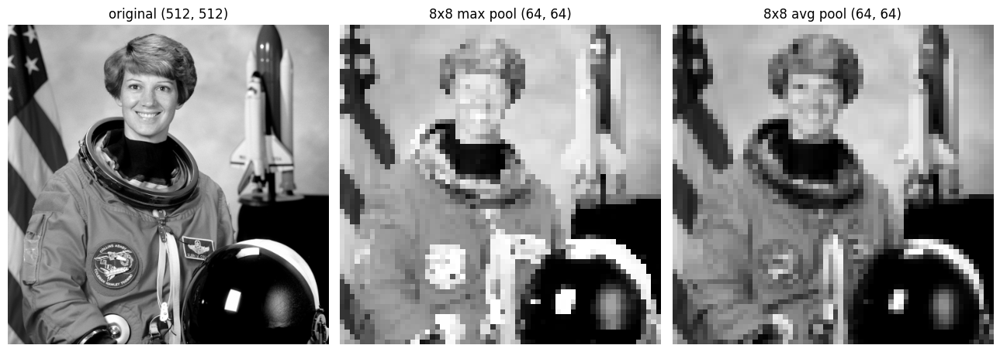

In [43]:
pooled_max =  max_pool2d(gray, size=8)
pooled_avg =  avg_pool2d(gray, size=8)

fig, axes = plt.subplots(1, 3, figsize=(13, 4.5))
axes[0].imshow(gray, cmap="gray"); axes[0].set_title(f"original {gray.shape}")
axes[1].imshow(pooled_max, cmap="gray"); axes[1].set_title(f"8x8 max pool {pooled_max.shape}")
axes[2].imshow(pooled_avg, cmap="gray"); axes[2].set_title(f"8x8 avg pool {pooled_avg.shape}")
for ax in axes: ax.axis("off")
plt.tight_layout(); plt.show()


## B8 · CNN architecture hyperparameters, in PyTorch

> *Lecture recap:* a convolutional layer's key hyperparameters are **kernel
> size**, **number of kernels** (= number of output channels / feature maps),
> **stride**, and **padding**. Let's confirm our from-scratch output-size
> formula against a real `nn.Conv2d` layer, and build a tiny CNN block
> (conv → batchnorm → relu → maxpool) to see how the pieces from this notebook
> compose in practice.


In [44]:
import torch
import torch.nn as nn

# TODO -- build a small conv block: Conv2d(in=1, out=8, kernel=3, stride=1,
# pad=1) -> BatchNorm2d(8) -> ReLU -> MaxPool2d(2), and check the output shape
# against the formula out = floor((in + 2*pad - k)/stride) + 1.

conv_block = nn.Sequential(
    nn.Conv2d(1, 8, kernel_size=3, stride=1, padding=1),
    nn.BatchNorm2d(8),
    nn.ReLU(),
    nn.MaxPool2d(2)
)

x = torch.from_numpy(gray[np.newaxis, np.newaxis, :, :].astype(np.float32))   # (1,1,H,W)
with torch.no_grad():
    out = conv_block(x)

print("input shape: ", tuple(x.shape))
print("output shape:", tuple(out.shape))
print("(H after conv stays 512 due to padding=1; after 2x2 maxpool it halves to 256)")


input shape:  (1, 1, 512, 512)
output shape: (1, 8, 256, 256)
(H after conv stays 512 due to padding=1; after 2x2 maxpool it halves to 256)


## B9 · Data augmentation

> *Lecture recap:* most CV tasks benefit from more data. **Data augmentation**
> creates realistic variations of existing images so a model generalizes
> better and overfits less. Common techniques: **horizontal flip** (valid
> whenever mirroring preserves the label — a mirrored cat is still a cat),
> **random cropping** (works as long as crops are a reasonably large subset of
> the image), and **color shifting** (perturbing R/G/B channels to simulate
> lighting/camera variation).


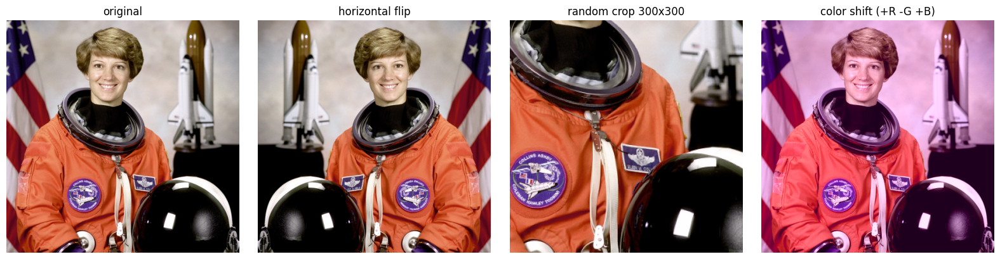

In [45]:
# TODO -- implement horizontal flip, random crop, and color shift by hand.

def hflip(image):
    return image[:, ::-1]

def random_crop(image, crop_h, crop_w, seed=None):
    rng = np.random.default_rng(seed)
    h, w = image.shape[:2]
    top  = rng.integers(0, h - crop_h)
    left = rng.integers(0, w - crop_w)
    return image[top:top+crop_h, left:left+crop_w]

def color_shift(image, dr, dg, db):
    out = image.astype(np.int16)
    out[:, :, 0] = np.clip(out[:, :, 0] + dr, 0, 255)
    out[:, :, 1] = np.clip(out[:, :, 1] + dg, 0, 255)
    out[:, :, 2] = np.clip(out[:,:,2] + db, 0, 255)
    return out.astype(np.uint8)

flipped = hflip(img_rgb)
cropped = random_crop(img_rgb, 300, 300, seed=0)
shifted = color_shift(img_rgb, dr=30, dg=-20, db=30)   # more red/blue, less green -> purpley

fig, axes = plt.subplots(1, 4, figsize=(16, 4))
axes[0].imshow(img_rgb); axes[0].set_title("original")
axes[1].imshow(flipped); axes[1].set_title("horizontal flip")
axes[2].imshow(cropped); axes[2].set_title("random crop 300x300")
axes[3].imshow(shifted); axes[3].set_title("color shift (+R -G +B)")
for ax in axes: ax.axis("off")
plt.tight_layout(); plt.show()


### TODO B9.1
Build an `augment_batch(image, n)` function that returns `n` randomly
augmented versions of `image`, each with a random combination of flip
(50% chance), crop, and a small random color shift. Display a 2×3 grid of
results.


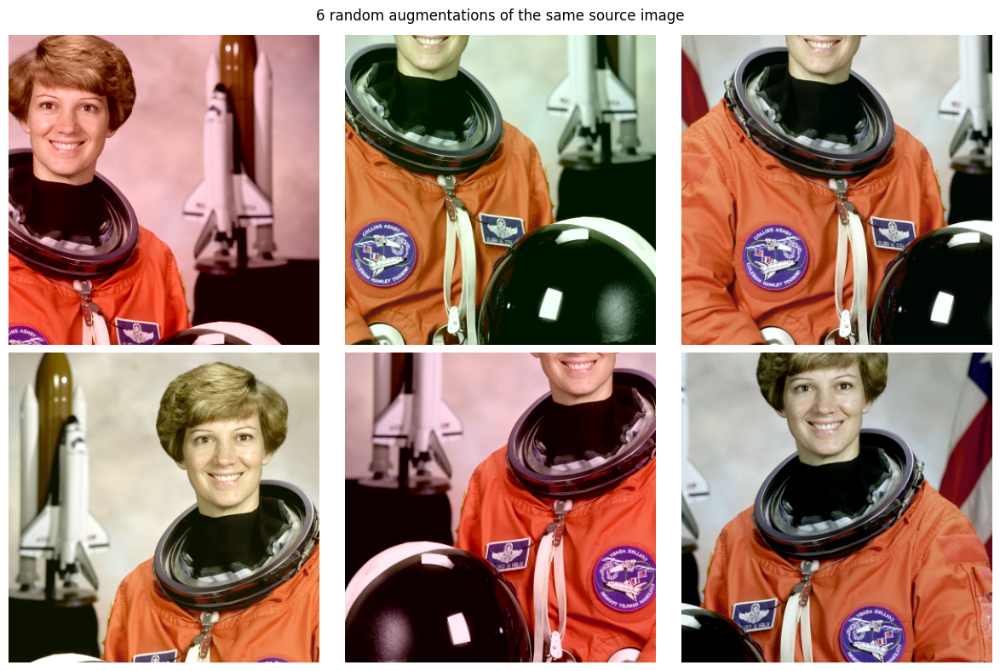

In [46]:
def augment_batch(image, n, seed=0):
    rng = np.random.default_rng(seed)
    out = []
    for _ in range(n):
        im = image.copy()
        if rng.random() < 0.5:
            im = hflip(im)
        im = random_crop(im, 350, 350, seed=int(rng.integers(0, 1e6)))
        dr, dg, db = rng.integers(-25, 25, size=3)
        im = color_shift(im, dr, dg, db)
        out.append(im)
    return out

augmented = augment_batch(img_rgb, 6, seed=1)
fig, axes = plt.subplots(2, 3, figsize=(12, 8))
for ax, im in zip(axes.ravel(), augmented):
    ax.imshow(im); ax.axis("off")
plt.suptitle("6 random augmentations of the same source image")
plt.tight_layout(); plt.show()


## B10 · A note on transfer learning

> *Lecture recap:* rather than training a CNN from scratch, **transfer
> learning** starts from a model pretrained on a large dataset (e.g.
> ImageNet), **freezes** most of its layers (keeping their learned filters),
> and **fine-tunes** only the last few layers on your smaller, task-specific
> dataset. This is why the filters/feature-maps intuition from Section B5
> matters — a pretrained network's early filters already detect edges,
> textures, and colors that are useful for almost *any* vision task.


In [47]:
import torchvision.models as models

# TODO -- load a pretrained ResNet18, freeze all its layers, then replace the
# final fully-connected layer with a new (trainable) one for a 5-class task.

resnet = models.resnet18(weights=models.ResNet18_Weights.DEFAULT)

for param in resnet.parameters():
    param.requires_grad = False  #-- freeze everything

num_classes = 5
resnet.fc =  nn.Linear(resnet.fc.in_features, num_classes)

trainable = sum(p.numel() for p in resnet.parameters() if p.requires_grad)
total     = sum(p.numel() for p in resnet.parameters())
print(f"trainable parameters: {trainable:,} / {total:,} total")
print("(only the new final layer is trainable -- everything else is frozen, pretrained ResNet18 weights)")


Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 128MB/s]


trainable parameters: 2,565 / 11,179,077 total
(only the new final layer is trainable -- everything else is frozen, pretrained ResNet18 weights)


---
## Wrap-up

You've now built, by hand, every core piece from the lecture:

- **Classical CV:** pixels-as-numbers, color spaces (RGB/HSV), thresholding,
  morphology, convolution, Sobel, Canny, geometric transforms, histogram
  equalization.
- **Neural nets:** a single neuron, an MLP forward pass, activation functions,
  why initialization/batchnorm/residuals stabilize gradients, and
  overfitting/underfitting with dropout as a fix.
- **CNNs:** convolution as a *learned* filter, stride, padding, pooling, and
  how they compose into a real `nn.Conv2d` block.
- **Data augmentation & transfer learning:** the practical techniques used to
  get more mileage out of limited labeled data.

Next step: put these blocks together into an actual trainable CNN classifier
on a real dataset (Part 2 territory).
